In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.io
import glob
import mat73
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.graph_objects as go 
import sys
# Adjust the path below to the path of your `module_directory`
sys.path.append('../thesis-2p-behavior-align/')
# Now you can import your module or function
import imaging_behavior_functions
import odor_behavioral_analysis
import scipy.cluster.hierarchy as sch
from rastermap import Rastermap, utils
from scipy.stats import zscore
from scipy.stats import sem
from scipy.spatial import KDTree

In [3]:
base_path = "//research.files.med.harvard.edu/neurobio/wilsonlab/Jingxuan/stacks/"
example_path_data = base_path+"20231205-4_hDeltaB_tomogcamp7f_5dur75isi_fly2/data/"
example_path_results = base_path+"20231205-4_hDeltaB_tomogcamp7f_5dur75isi_fly2/results/"
trial_num = 1
odor_threshold = 5
time_interval_threshold = 16  # Assuming time is in seconds or an equivalent unit
k = 8
window_size = 30

is_mat73, roi_df, dff_raw, kinematics_raw, preprocessed_vars_ds, preprocessed_vars_odor = imaging_behavior_functions.load_intermediate_mat(example_path_data,trial_num)
behav_df = imaging_behavior_functions.make_df_behavior(dff_raw, preprocessed_vars_ds, preprocessed_vars_odor,trial_num,ball_d = 9)
xPos, yPos = imaging_behavior_functions.reconstruct_path(behav_df, ball_d = 9)
roi_names, hdeltab_index, epg_index, hdeltab_sequence, epg_sequence = imaging_behavior_functions.get_roi_seq(roi_df)
dff_all_rois, dff_time = imaging_behavior_functions.load_dff_raw(is_mat73, dff_raw)
neural_df = imaging_behavior_functions.make_df_neural(dff_all_rois, dff_time, roi_names, hdeltab_index, epg_index, hdeltab_sequence, epg_sequence)
behav_df, padded_result_df, smoothed_df = odor_behavioral_analysis.analysis_dfs(behav_df, time_interval_threshold, k, window_size)
combined_df = imaging_behavior_functions.combine_df(behav_df, neural_df)
smoothed_df["translationalV_smoothed"] = np.sqrt(smoothed_df["fwV_smoothed"]**2+smoothed_df["sideV_smoothed"]**2)

In [3]:
selected_df = neural_df.drop(columns=['time'])
selected_df

,hDeltaB_0,hDeltaB_1,hDeltaB_2,hDeltaB_3,hDeltaB_4,hDeltaB_5,hDeltaB_6,hDeltaB_7,hDeltaB_8,hDeltaB_9,hDeltaB_10,hDeltaB_11
0,0.067182,0.160227,0.081253,0.009190,0.019644,0.003423,0.015684,-0.047264,-0.004261,0.065573,0.128344,0.267302
1,0.113393,0.156151,0.075551,0.046179,0.013253,-0.015796,-0.006278,-0.035016,0.004829,0.045642,0.114370,0.338818
2,0.150793,0.161208,0.072277,0.075688,0.025626,-0.020140,-0.010499,-0.026168,0.021801,0.046403,0.104895,0.381662
3,0.156863,0.175518,0.077826,0.083740,0.058145,-0.000332,0.000631,-0.011459,0.049131,0.061871,0.094829,0.365157
4,0.128071,0.168776,0.082242,0.074708,0.069190,0.014238,0.006162,-0.004507,0.050148,0.055686,0.083402,0.302955
...,...,...,...,...,...,...,...,...,...,...,...,...
3490,0.120887,0.168595,0.117021,0.146620,0.175909,0.180057,0.159247,0.091957,0.117306,0.096745,0.110315,0.210445
3491,0.156958,0.162354,0.119769,0.103034,0.154810,0.156696,0.125775,0.089120,0.100946,0.094543,0.081195,0.234688
3492,0.214150,0.143146,0.118893,0.083091,0.155062,0.144924,0.115857,0.103902,0.094422,0.095494,0.094089,0.263892
3493,0.199519,0.116515,0.101906,0.076322,0.147625,0.104345,0.099341,0.098168,0.097290,0.083225,0.091479,0.251051


In [4]:
roi_kw = 'hDeltaB'
roi_mtx = imaging_behavior_functions.extract_heatmap(neural_df, roi_kw, 1, example_path_results, trial_num)
param_df = imaging_behavior_functions.fit_sinusoid(neural_df,roi_mtx)
param_df

,time,phase,baseline,amplitude,phase_error,baseline_error,amplitude_error
0,0.000000,0.000000,-0.976340,0.824229,0.213832,0.120547,0.164510
1,0.171689,0.000000,-0.957066,0.980153,0.142866,0.095862,0.130961
2,0.343377,0.000000,-0.868282,1.031191,0.149921,0.105869,0.144682
3,0.515066,0.000000,-0.731641,0.887192,0.165593,0.100656,0.137633
4,0.686754,0.571199,-0.758464,0.719398,0.163581,0.080973,0.111259
...,...,...,...,...,...,...,...
3490,599.193064,2.855993,0.023821,0.390032,0.282704,0.075953,0.104487
3491,599.364752,2.284795,-0.121618,0.217824,0.422032,0.064369,0.090127
3492,599.536441,2.284795,-0.109355,0.075390,1.320773,0.070645,0.100242
3493,599.708129,0.571199,-0.251663,0.022362,3.906305,0.060520,0.083793


In [5]:
base_dir = '//research.files.med.harvard.edu/neurobio/wilsonlab/Jingxuan/stacks/20231205-4_hDeltaB_tomogcamp7f_5dur75isi_fly2/E_05_Iter_10368/plane_4/suite2p/plane0'
F = np.load(base_dir+'/F.npy', allow_pickle=True)
Fneu = np.load(base_dir+'/Fneu.npy', allow_pickle=True)
spks = np.load(base_dir+'/spks.npy', allow_pickle=True)
stat = np.load(base_dir+'/stat.npy', allow_pickle=True)
ops =  np.load(base_dir+'/ops.npy', allow_pickle=True)
ops = ops.item()
iscell = np.load(base_dir+'/iscell.npy', allow_pickle=True)

In [50]:
F_cell = F[(iscell[:,0]==1),:]
spks_cell = spks[(iscell[:,0]==1),:]
Fneu_cell = Fneu[(iscell[:,0]==1),:]
stat_cell = stat[(iscell[:,0]==1)]

In [7]:
n_components=50
def perform_pca(selected_df, n_components):
    """
    Perform PCA on the given dataframe.

    Args:
    - data (pd.DataFrame): The dataframe containing neuron activity data.
    - n_components (int): The number of principal components to compute.

    Returns:
    - pca (PCA object): The PCA object after fitting the data.
    - transformed_data (np.array): Data transformed into principal components.
    - explained_variance_ratio (np.array): The amount of variance explained by each of the selected components.
    """
    # Standardize the data (important for PCA)
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(selected_df)

    # Perform PCA
    pca = PCA(n_components=n_components)
    transformed_data = pca.fit_transform(scaled_data)
    explained_variance_ratio = pca.explained_variance_ratio_

    return pca, transformed_data, explained_variance_ratio
pca, transformed_data, explained_variance_ratio = perform_pca(F_cell.T,n_components)

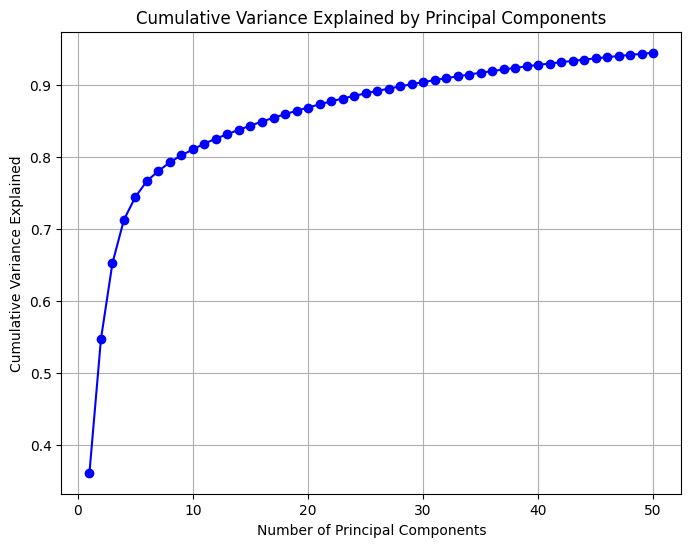

In [8]:
# Calculate cumulative variance explained
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# Plot cumulative variance explained
plt.figure(figsize=(8, 6))
plt.plot(np.arange(1, n_components + 1), cumulative_variance, marker='o', linestyle='-', color='b')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Variance Explained')
plt.title('Cumulative Variance Explained by Principal Components')
plt.grid(True)
plt.show()

In [9]:
behav_df

,time,fwV,sideV,yawV,heading,abssideV,absyawV,net_motion,net_motion_state,heading_adj,odor,xPos,yPos,cluster_label_temporal,soft_cluster_label_temporal,cluster_label_spatial
0,0.000000,0.000000,0.000000,0.000000,5.821488,0.000000,0.000000,0.000000,0,5.821488,-0.000000,0.000000,0.000000,0,0,0
1,0.171689,-0.675403,-1.490644,-0.289618,5.825515,1.490644,0.289618,2.455665,1,5.825515,-0.008162,-0.014737,-0.130114,0,0,0
2,0.343377,0.546405,0.303099,0.249274,5.818040,0.303099,0.249274,1.098778,1,5.818040,-0.005281,-0.012181,-0.033403,0,0,0
3,0.515066,0.295538,4.428805,-0.299559,5.820663,4.428805,0.299559,5.023902,1,5.820663,-0.007800,0.029971,0.059601,0,0,0
4,0.686754,-0.018680,-0.374698,-0.086493,5.822568,0.374698,0.086493,0.479871,1,5.822568,-0.004125,0.026391,0.052825,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3490,599.193064,0.009276,1.728540,0.047387,0.667469,1.728540,0.047387,1.785203,1,13.233839,9.672715,-19.561727,11.785957,0,0,6
3491,599.364752,0.076589,0.581502,-0.176502,0.673241,0.581502,0.176502,0.834592,1,13.239612,9.678766,-19.542439,11.788823,0,0,6
3492,599.536441,-0.101077,1.930576,-0.140592,0.664939,1.930576,0.140592,2.172245,1,13.231310,9.667059,-19.533578,11.772654,0,0,6
3493,599.708129,0.103593,-1.294534,0.226270,0.673200,1.294534,0.226270,1.624396,1,13.239570,9.665737,-19.533856,11.786141,0,0,6


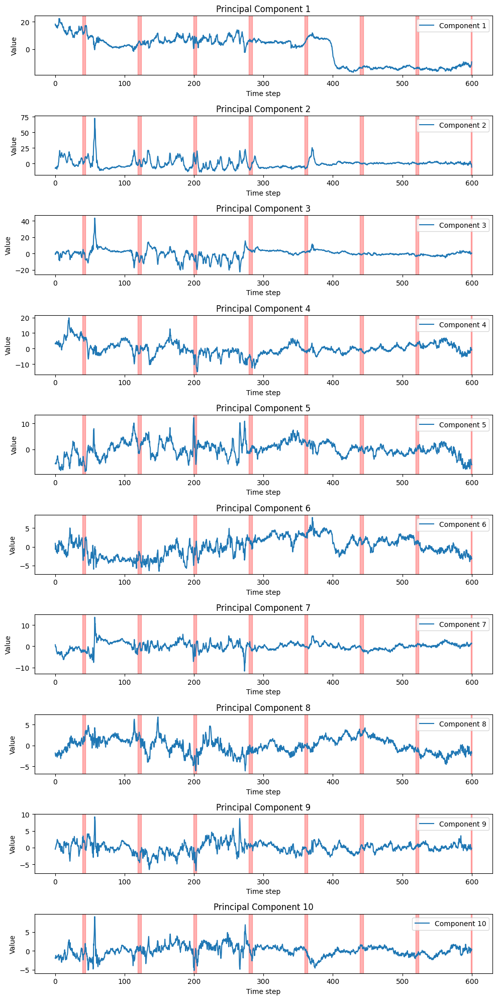

In [10]:
# visualze top PCstime_steps = range(transformed_data.shape[0])

n_components = 10
time_steps = range(transformed_data.shape[0])
# Check if 'odor' column exists and shade where odor > 5
if 'odor' in behav_df.columns:
    odor_mask = behav_df['odor'] > 5

# Create a figure with subplots
fig, axes = plt.subplots(n_components, 1, figsize=(10, 2*n_components))

for i in range(n_components):
    ax = axes[i]
    ax.plot(neural_df.time, transformed_data[:, i], label=f'Component {i+1}')
    ax.set_title(f'Principal Component {i+1}')
    ax.set_xlabel('Time step')
    ax.set_ylabel('Value')
    ax.legend()
    # Apply shading to all subplots
    ax.fill_between(behav_df['time'], ax.get_ylim()[0], ax.get_ylim()[1], where=odor_mask, color='red', alpha=0.3, transform=ax.get_xaxis_transform())
    

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()

In [11]:
# Extract the first three PCs
pc1 = transformed_data[:, 0]
pc2 = transformed_data[:, 1]
pc3 = transformed_data[:, 2]

# Time steps for coloring
#phase = np.array(param_df.phase)
#heading = 2*np.pi - np.array(behav_df.heading)
x_pos = np.array([stat[i]['med'][0] for i in range(len(stat))])
x_pos_cell = x_pos[(iscell[:,0]==1)]
y_pos = np.array([stat[i]['med'][1] for i in range(len(stat))])
y_pos_cell = y_pos[(iscell[:,0]==1)]
heading = 2*np.pi-behav_df.heading
odor = behav_df.odor
phase = param_df.phase
amplitude = param_df.amplitude
baseline = param_df.baseline
# Create the figure
fig = go.Figure(data=[go.Scatter3d(
    x=pc1,
    y=pc2,
    z=pc3,
    mode='markers',
    marker=dict(
        size=5,
        color=odor, 
        colorscale='Viridis',  # Choose a color scale
        colorbar=dict(title='y position'),
        opacity=0.8
    )
)])

# Set the layout of the figure
fig.update_layout(
    title='Trajectory of the First 3 Principal Components in State Space',
    scene=dict(
        xaxis_title='PC1',
        yaxis_title='PC2',
        zaxis_title='PC3'
    ),
    margin=dict(l=0, r=0, b=0, t=30)
)

# Show the figure
fig.show()


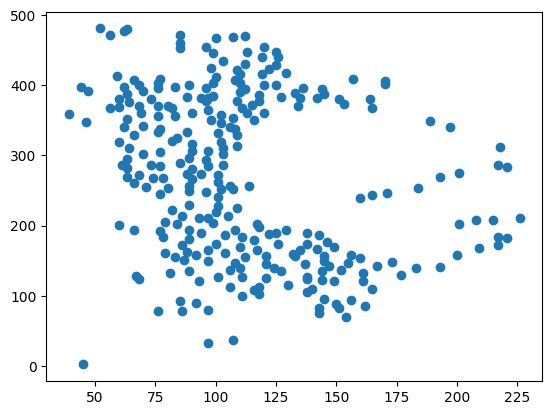

In [12]:
# visualize position of ROIs
plt.scatter(x_pos_cell,y_pos_cell)
# x_pos: within column
# y_pos: across columns

<Axes: >

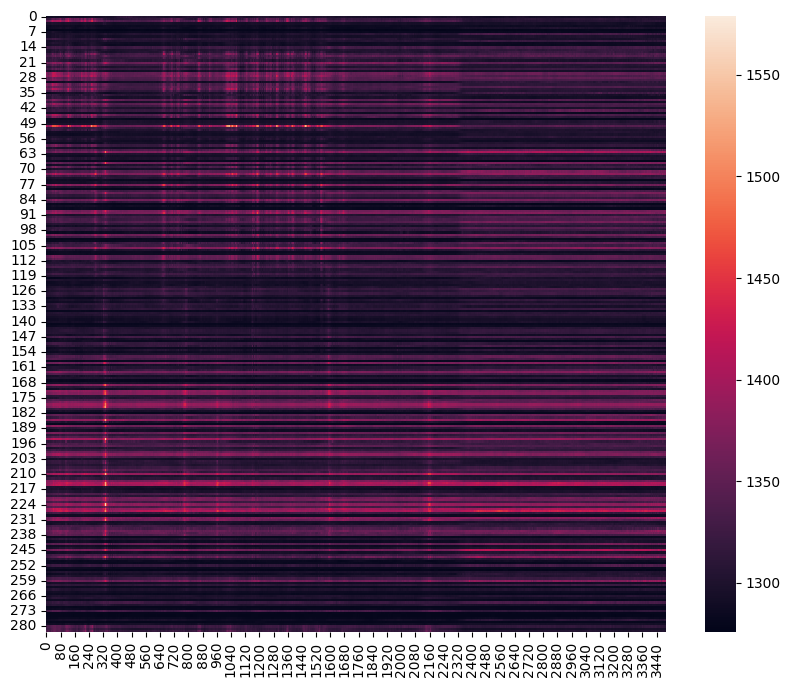

In [13]:
fig, ax = plt.subplots(figsize=(10,8))
sort_id_x = np.argsort(x_pos_cell)
sort_id_y = np.argsort(y_pos_cell)
sns.heatmap(F_cell[sort_id_y])

In [14]:
def dfoverf(F):
    # Determine F_0 using the 5th percentile of the fluorescence data
    F_0 = np.percentile(F, 5, axis=1)

    # Calculate ΔF/F
    deltaF_over_F = (F - F_0[:, np.newaxis]) / F_0[:, np.newaxis]
    return deltaF_over_F
dF_cell = dfoverf(F_cell)

<Axes: >

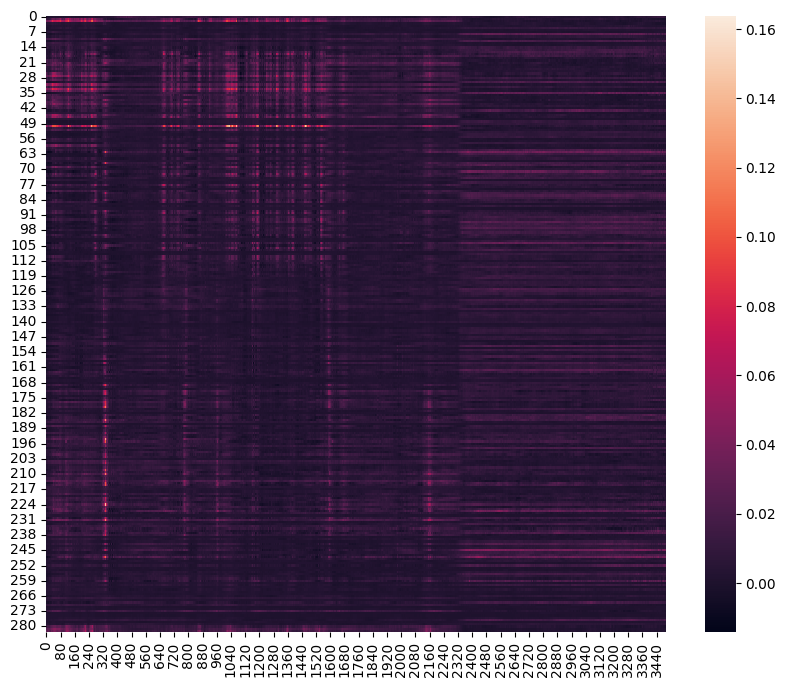

In [15]:
fig, ax = plt.subplots(figsize=(10,8))
sort_id_x = np.argsort(x_pos_cell)
sort_id_y = np.argsort(y_pos_cell)
sns.heatmap(dF_cell[sort_id_y])

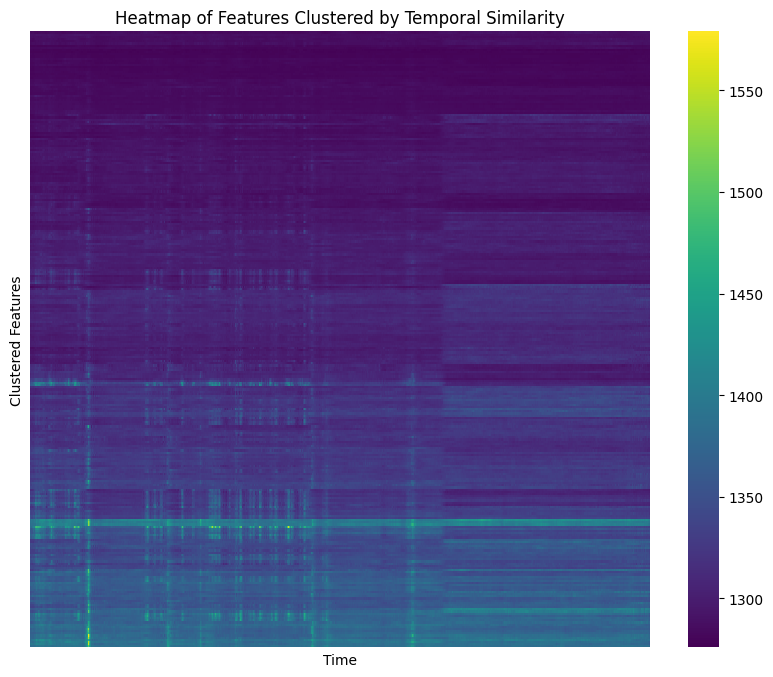

In [16]:
def hierachical_cluster(matrix, method='average', metric='euclidean'):
    """
    Clusters a matrix on the feature dimension based on temporal similarity and plots a heatmap.
    
    Parameters:
    - matrix: A 2D NumPy array with shape (features, time).
    - method: Method of clustering ('average', 'single', 'complete', etc.).
    - metric: Distance metric for clustering ('euclidean', 'cosine', etc.).
    """
    
    # Perform hierarchical clustering on the features
    Y = sch.linkage(matrix, method=method, metric=metric)
    Z = sch.dendrogram(Y, orientation='right', no_plot=True)  # 'no_plot=True' to not plot the dendrogram
    
    # Reorder the matrix according to the clustering
    index = Z['leaves']
    matrix_clustered = matrix[index, :]
    # Create a heatmap of the clustered matrix
    fig, ax = plt.subplots(figsize=(10,8))
    sns.heatmap(matrix_clustered, cmap='viridis', xticklabels=False, yticklabels=False)
    ax.set_title('Heatmap of Features Clustered by Temporal Similarity')
    ax.set_xlabel('Time')
    ax.set_ylabel('Clustered Features')
    plt.show()
    return Y, matrix_clustered

Y, F_cell_clus = hierachical_cluster(F_cell, method='average', metric='euclidean')

In [23]:
def cluster_dict_n(Y,last_x_step):
    # Initialize cluster labels for each original observation
    n = Y.shape[0] + 1  # Number of original observations
    cluster_labels = {i: [i] for i in range(n)}

    # Iterate over the linkage matrix
    for i, row in enumerate(Y[:n-1-last_x_step,:]):
        new_cluster_idx = n + i  # Index of the new cluster being formed
        cluster_i, cluster_j = int(row[0]), int(row[1])  # Clusters/observations being merged
        
        # Combine the labels from the clusters being merged into the new cluster
        cluster_labels[new_cluster_idx] = cluster_labels.pop(cluster_i) + cluster_labels.pop(cluster_j)
        
        # Optionally, print or store this information
        print(f"Step {i+1}: Merge clusters {cluster_i} and {cluster_j} into new cluster {new_cluster_idx}.")
    return cluster_labels
    # At this point, `cluster_labels` contains the labels for each step of the clustering

cluster_labels = cluster_dict_n(Y,4)


Step 1: Merge clusters 31 and 50 into new cluster 283.
Step 2: Merge clusters 33 and 34 into new cluster 284.
Step 3: Merge clusters 90 and 113 into new cluster 285.
Step 4: Merge clusters 19 and 150 into new cluster 286.
Step 5: Merge clusters 30 and 98 into new cluster 287.
Step 6: Merge clusters 84 and 284 into new cluster 288.
Step 7: Merge clusters 45 and 68 into new cluster 289.
Step 8: Merge clusters 64 and 287 into new cluster 290.
Step 9: Merge clusters 29 and 283 into new cluster 291.
Step 10: Merge clusters 23 and 288 into new cluster 292.
Step 11: Merge clusters 121 and 178 into new cluster 293.
Step 12: Merge clusters 4 and 290 into new cluster 294.
Step 13: Merge clusters 0 and 291 into new cluster 295.
Step 14: Merge clusters 286 and 294 into new cluster 296.
Step 15: Merge clusters 205 and 293 into new cluster 297.
Step 16: Merge clusters 8 and 289 into new cluster 298.
Step 17: Merge clusters 285 and 292 into new cluster 299.
Step 18: Merge clusters 3 and 46 into new c

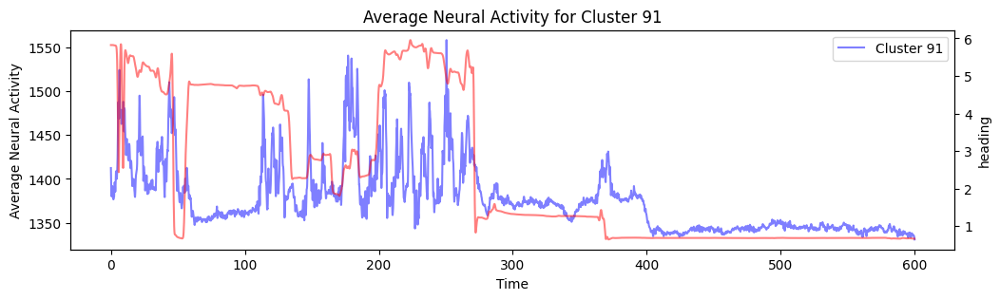

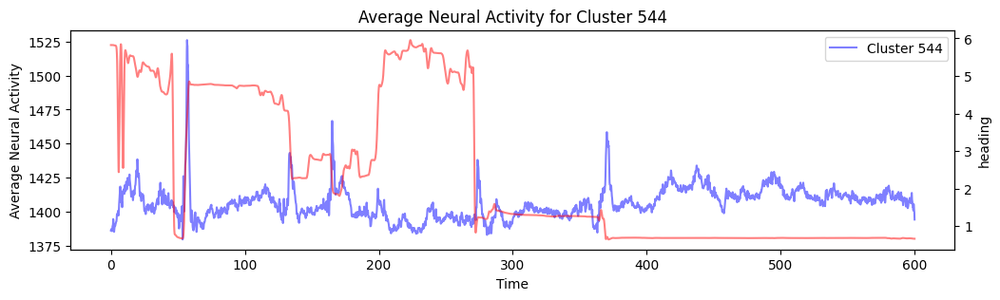

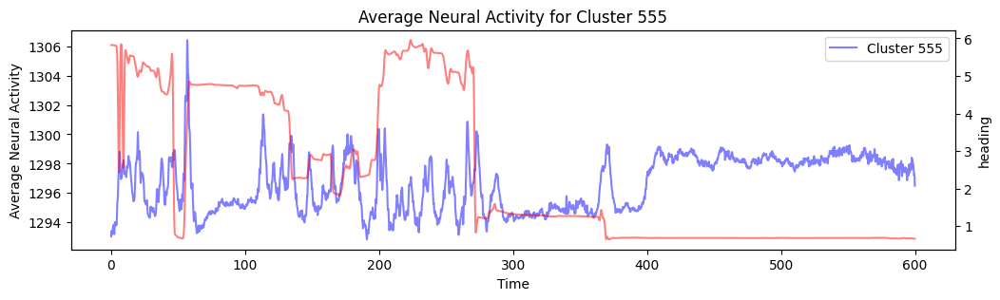

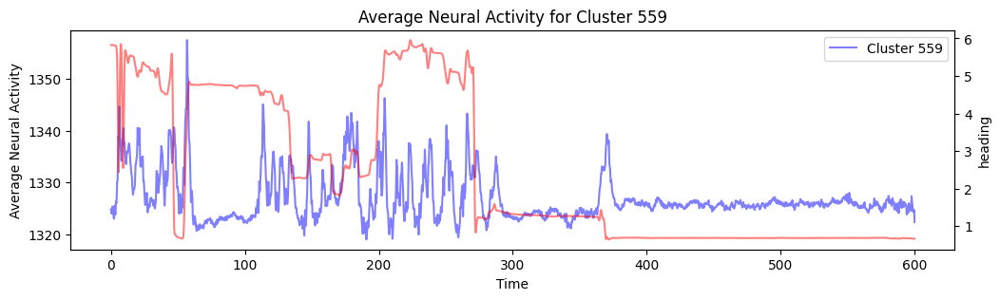

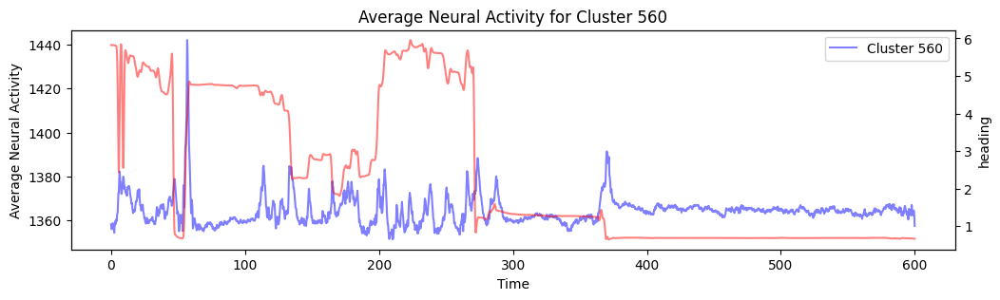

In [24]:
def plot_avg(F, cluster_labels, behav_df, ref_kw):
    for cluster_idx, roi_indices in cluster_labels.items():
        # Extract activities for the current cluster
        cluster_activities = F[roi_indices, :]
        
        # Compute the average activity over time for the cluster
        avg_activity = np.mean(cluster_activities, axis=0)
        
        # Plot the average activity
        fig, ax = plt.subplots(figsize=(12, 3))
        ax.plot(behav_df.time, avg_activity, label=f'Cluster {cluster_idx}',color = 'blue',alpha=0.5)
        ax2 = ax.twinx()
        ax2.plot(behav_df.time, imaging_behavior_functions.apply_gaussian_smoothing(behav_df[ref_kw],3),color = 'red', alpha=0.5)
        ax2.set_ylabel(ref_kw)
        ax.set_xlabel('Time')
        ax.set_ylabel('Average Neural Activity')
        ax.set_title(f'Average Neural Activity for Cluster {cluster_idx}')
        ax.legend()
        plt.show()

plot_avg(F_cell, cluster_labels, behav_df, 'heading')

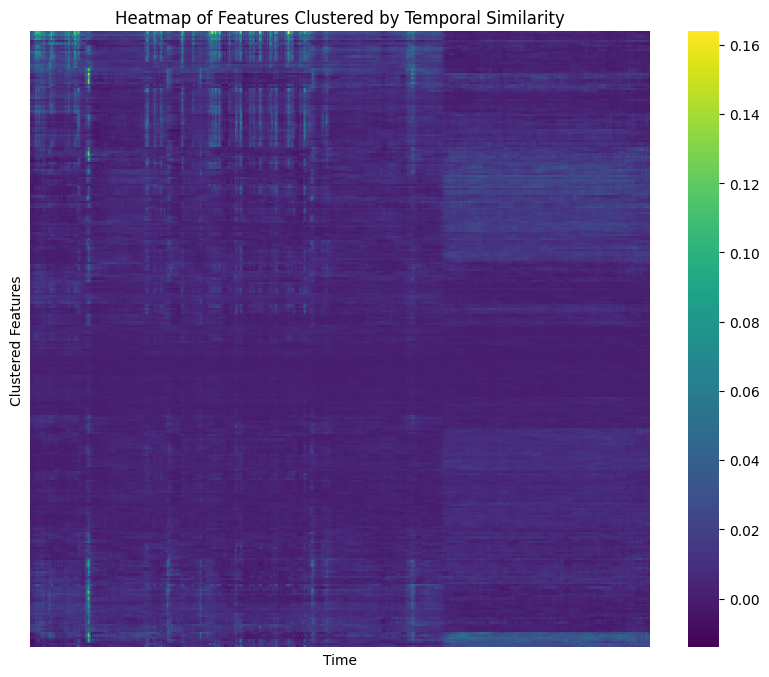

In [25]:
Y_dF, dF_cell_clus = hierachical_cluster(dF_cell, method='average', metric='euclidean')

Step 1: Merge clusters 50 and 113 into new cluster 283.
Step 2: Merge clusters 30 and 64 into new cluster 284.
Step 3: Merge clusters 31 and 283 into new cluster 285.
Step 4: Merge clusters 15 and 79 into new cluster 286.
Step 5: Merge clusters 33 and 34 into new cluster 287.
Step 6: Merge clusters 98 and 284 into new cluster 288.
Step 7: Merge clusters 0 and 285 into new cluster 289.
Step 8: Merge clusters 19 and 150 into new cluster 290.
Step 9: Merge clusters 84 and 287 into new cluster 291.
Step 10: Merge clusters 8 and 68 into new cluster 292.
Step 11: Merge clusters 4 and 290 into new cluster 293.
Step 12: Merge clusters 289 and 291 into new cluster 294.
Step 13: Merge clusters 29 and 90 into new cluster 295.
Step 14: Merge clusters 41 and 293 into new cluster 296.
Step 15: Merge clusters 121 and 205 into new cluster 297.
Step 16: Merge clusters 65 and 288 into new cluster 298.
Step 17: Merge clusters 296 and 298 into new cluster 299.
Step 18: Merge clusters 45 and 292 into new c

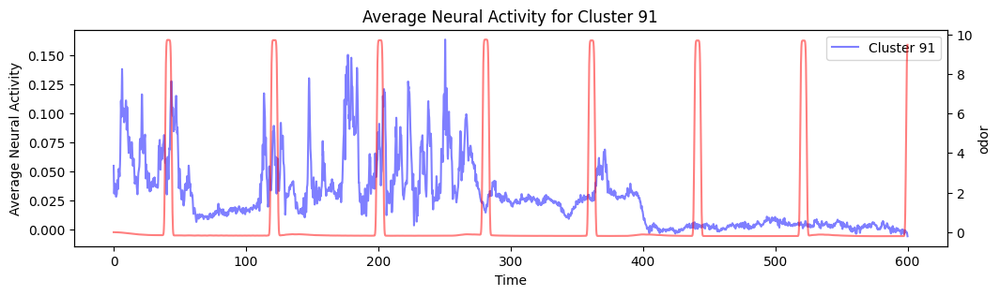

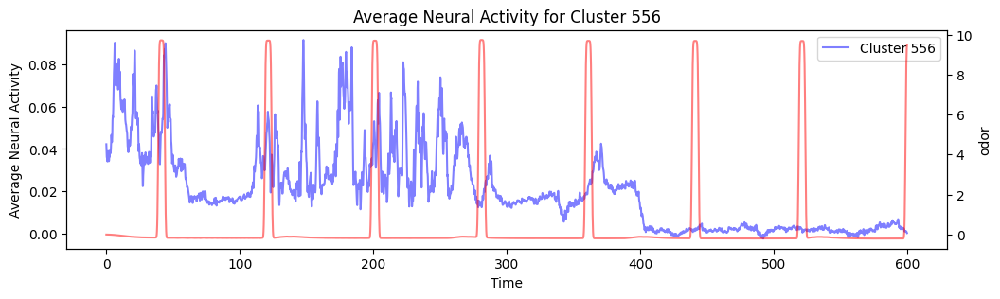

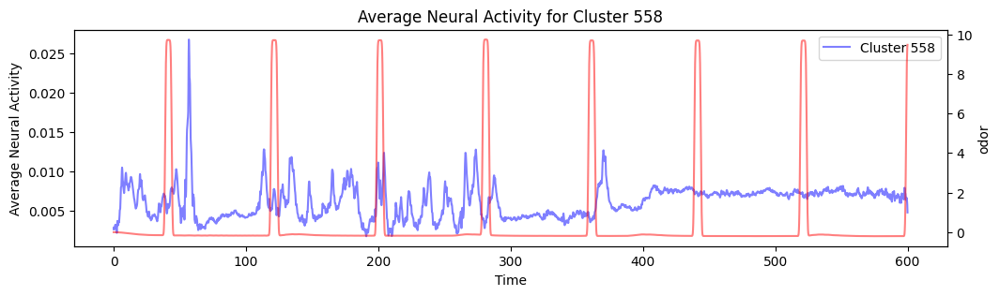

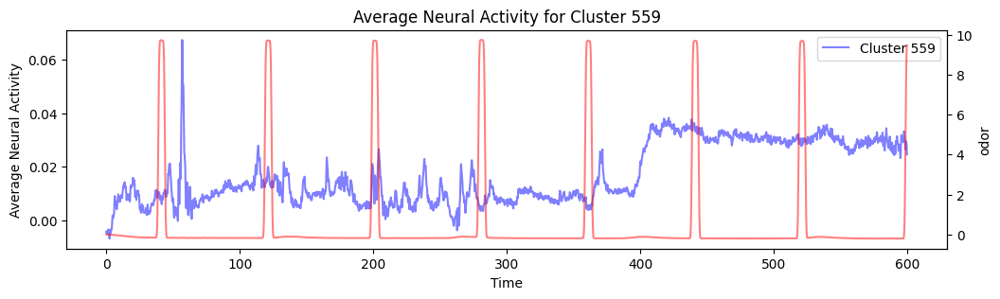

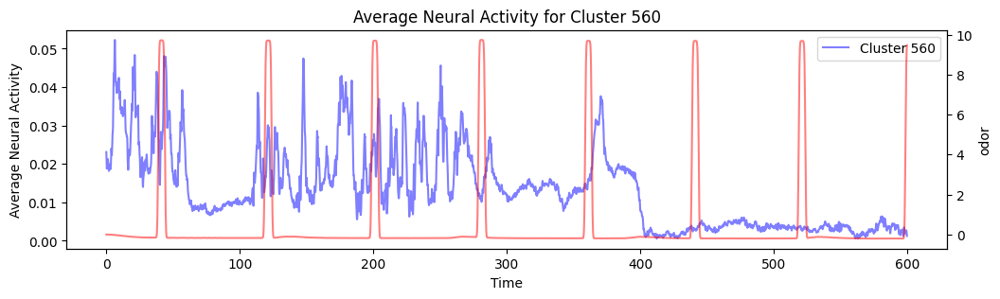

In [26]:
cluster_labels = cluster_dict_n(Y_dF,4)
plot_avg(dF_cell, cluster_labels, behav_df, 'odor')

## Rastermap

In [93]:
# load appropriate activity 
activity_mode = 3
if activity_mode == 0:
    fl_cell = F_cell
elif activity_mode == 1:
    fl_cell = Fneu_cell
elif activity_mode == 2:
    fl_cell = F_cell - 0.7 * Fneu_cell
else:
    fl_cell = dF_cell

In [94]:
fl_cell = zscore(fl_cell, axis=1)
fl_cell_norm = np.maximum(-4, np.minimum(8, fl_cell)) + 4
fl_cell_norm /= 12

In [95]:
model = Rastermap(n_clusters=18, # number of clusters to compute
                  n_PCs=128, # number of PCs to use
                  locality=0.75, # locality in sorting to find sequences (this is a value from 0-1)
                  time_lag_window=5, # use future timepoints to compute correlation
                  grid_upsample=10, # default value, 10 is good for large recordings
                  ).fit(fl_cell)
y = model.embedding # neurons x 1
isort = model.isort

normalizing data across axis=1
projecting out mean along axis=0
data normalized, 0.02sec
sorting activity: 283 valid samples by 3495 timepoints
n_PCs = 128 computed, 0.25sec
10 clusters computed, time 0.27sec
clusters sorted, time 0.28sec
clusters upsampled, time 0.30sec
rastermap complete, time 0.30sec


In [96]:
n_neurons, n_time = fl_cell.shape
nbin = 1 # number of neurons to bin over
ndiv = (n_neurons//nbin) * nbin
# group sorted matrix into rows of length nbin
sn = fl_cell[isort][:ndiv].reshape(ndiv//nbin, nbin, -1)
# take mean over neurons in a bin
sn = sn.mean(axis=1)

(-0.5, 0.5, 282.5, -0.5)

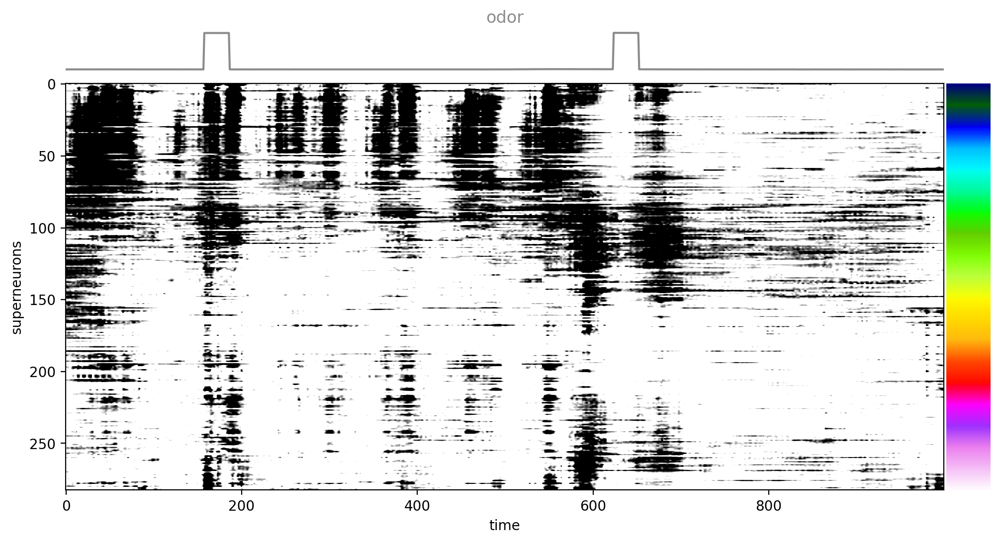

In [229]:
# timepoints to visualize
xmin = 1000
xmax = xmin + 1000

# make figure with grid for easy plotting
fig = plt.figure(figsize=(12,6), dpi=200)
grid = plt.GridSpec(9, 20, figure=fig, wspace = 0.05, hspace = 0.3)

# colors for the behaviors
kp_colors = np.array([[0.55,0.55,0.55], [0.,0.,1],
                      [0.8,0,0], [1.,0.4,0.2],
                      [0,0.6,0.4], [0.2,1,0.5],
                      ])

# plot behavior
ax = plt.subplot(grid[0, :-1])
ax.plot(np.array(behav_df.odor[xmin:xmax]), color=kp_colors[0])
ax.set_xlim([0, xmax-xmin])
ax.axis("off")
ax.set_title("odor", color=kp_colors[0])

# plot superneuron activity
ax = plt.subplot(grid[1:, :-1])
ax.imshow(sn[:, xmin:xmax], cmap="gray_r", vmin=0, vmax=0.8, aspect="auto")
ax.set_xlabel("time")
ax.set_ylabel("superneurons")

ax = plt.subplot(grid[1:, -1])
ax.imshow(np.arange(0, len(sn))[:,np.newaxis], cmap="gist_ncar", aspect="auto")
ax.axis("off")

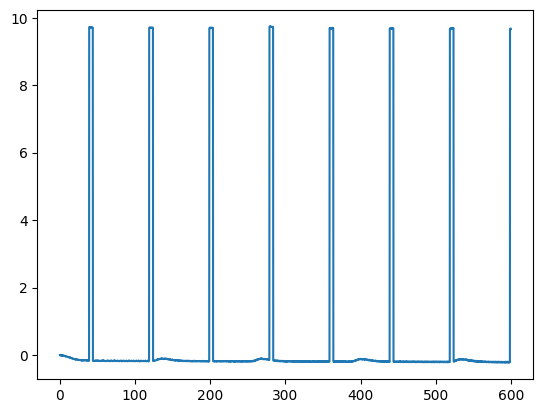

In [76]:
plt.plot(behav_df.time, behav_df.odor)

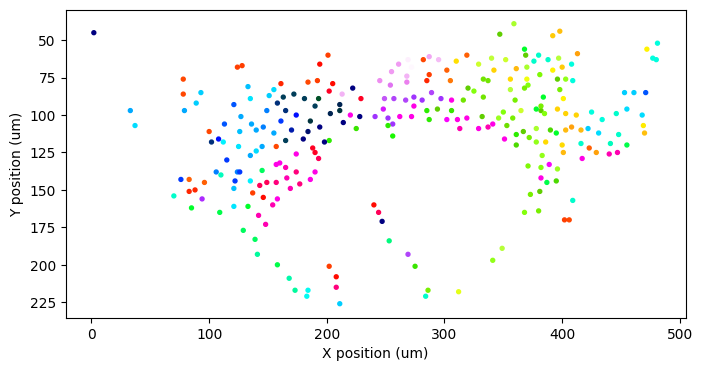

In [98]:
# POSITIONS OF ALL NEURONS
plt.figure(figsize=(8,4))
plt.scatter(y_pos_cell, x_pos_cell, s = 8, c=model.embedding[:,0], cmap="gist_ncar")
plt.xlabel('X position (um)')
plt.ylabel('Y position (um)')
plt.gca().invert_yaxis()
#plt.axis("square")

In [99]:
def map_to_bin(embedding, x_bins):
    # Define bin edges
    min_val = embedding.min()
    max_val = embedding.max()
    bins = np.linspace(min_val, max_val, x_bins + 1)  # +1 because we need edges for x bins

    # Map the embeddings to bin numbers
    bin_indices = np.digitize(embedding, bins, right=False) - 1  # Subtract 1 to make bin_indices start from 0

    # Create an array mapping embeddings to bin numbers
    mapped_embeddings = np.array([bin_indices[i] for i in range(len(embedding))])
    return mapped_embeddings

mapped_embeddings = map_to_bin(model.embedding[:,0], 9)

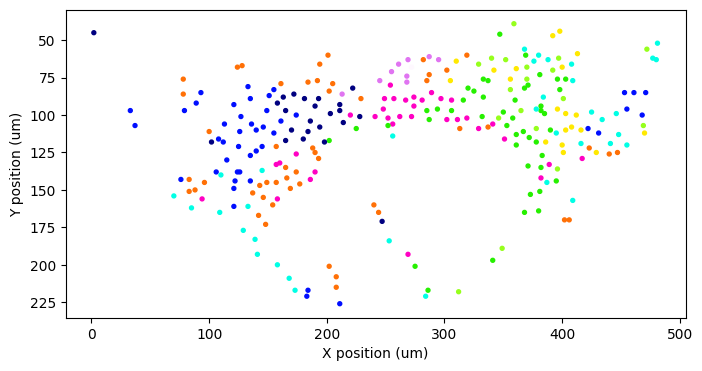

In [100]:
# POSITIONS OF ALL NEURONS
plt.figure(figsize=(8,4))
plt.scatter(y_pos_cell, x_pos_cell, s = 8, c=mapped_embeddings, cmap="gist_ncar")
plt.xlabel('X position (um)')
plt.ylabel('Y position (um)')
plt.gca().invert_yaxis()
#plt.axis("square")

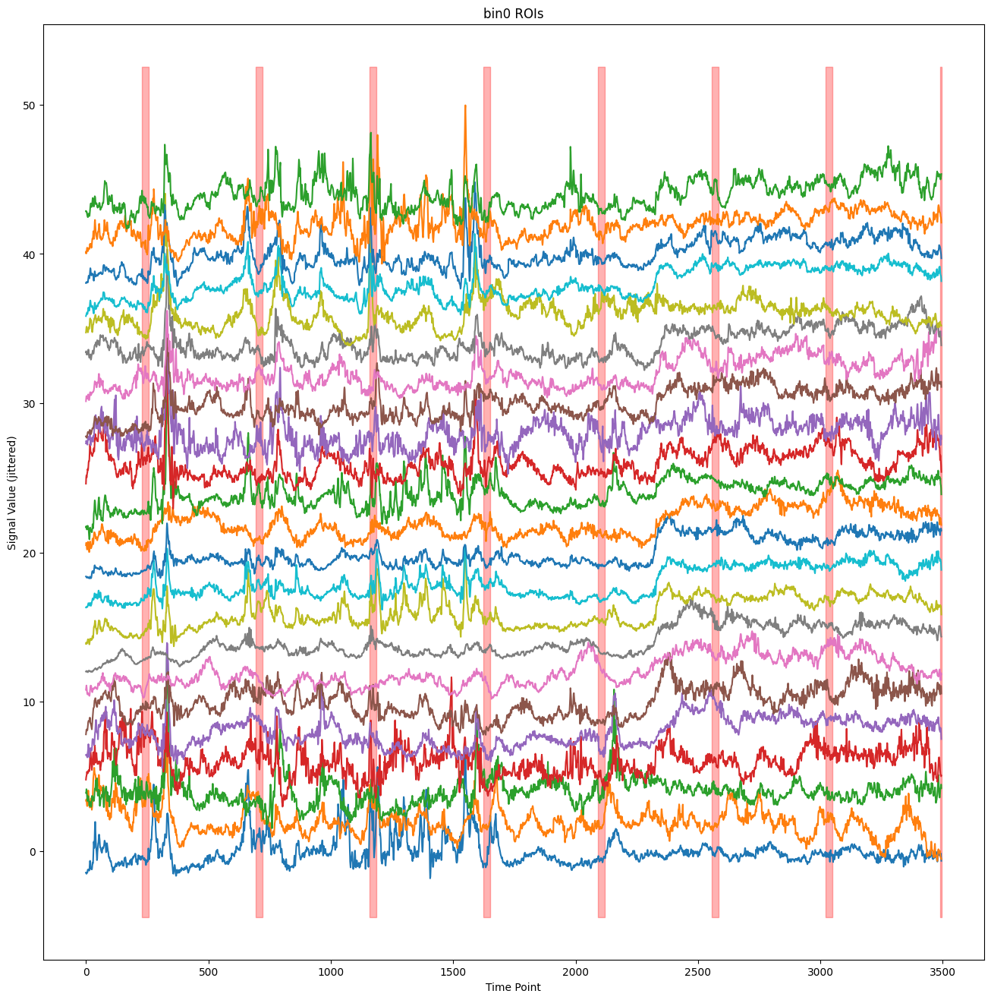

In [112]:
fig,ax = plt.subplots(figsize=(16, 16))
bin_index = 0
# Plot each signal with a jitter on the y-axis
y_offset = 2  # Adjust the offset value as needed
sn_binx = sn[mapped_embeddings == bin_index]
for i in range(len(sn_binx)):
    ax.plot(sn_binx[i,:] + (i * y_offset), label=f'Signal {i+1}')
ax.fill_between(behav_df.index, ax.get_ylim()[0], ax.get_ylim()[1], where=odor_mask, color='red', alpha=0.3)
    
# Add labels and title
plt.xlabel('Time Point')
plt.ylabel('Signal Value (jittered)')
plt.title('bin0 ROIs')

# Optionally, add a legend
#plt.legend()

# Show the plot
plt.show()

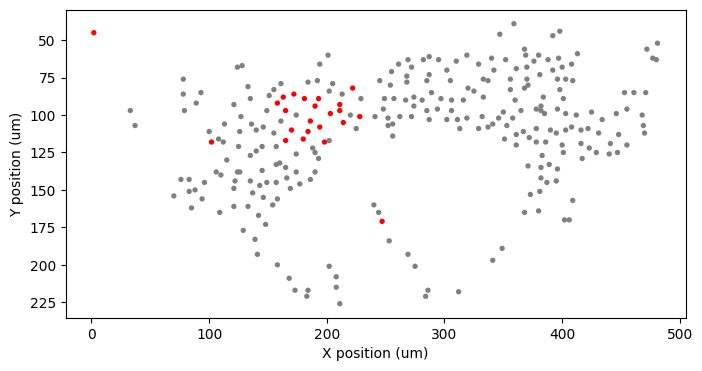

In [113]:
# Assuming cell_classes contains the class for each cell and class_of_interest is the one you want to highlight
def highlight_class(bin_index, mapped_embeddings):
    class_of_interest = bin_index  # Replace 'YourClassHere' with the actual class of interest
    highlight_color = 'red'  # Replace 'YourHighlightColorHere' with the color you want for the class of interest, e.g., 'red'

    # Create a color array, with gray for all cells not in the class of interest, and another color for those in the class
    colors = np.where(mapped_embeddings == class_of_interest, highlight_color, 'gray')

    # Now plot with the modified colors
    plt.figure(figsize=(8,4))
    plt.scatter(y_pos_cell, x_pos_cell, s=8, c=colors)  # Note: cmap here may not affect the colors since we're manually setting them
    plt.xlabel('X position (um)')
    plt.ylabel('Y position (um)')
    plt.gca().invert_yaxis()
    #plt.axis("square")
    plt.show()

highlight_class(bin_index, mapped_embeddings)

In [114]:
# plot around odor delivery
def find_odor_start_end(behav_df):
    odor_on = behav_df[behav_df.odor > 5].index
    odor_start = [odor_on[0]]
    odor_end = []
    for i in range(len(odor_on)-1):
        if odor_on[i+1] - odor_on[i]>5:
            odor_start.append(odor_on[i+1])
            odor_end.append(odor_on[i])
    if odor_on[-1] != len(behav_df)-1:
        odor_end.append(odor_on[-1])
    return odor_start[0:len(odor_end)], odor_end
odor_start, odor_end = find_odor_start_end(behav_df)


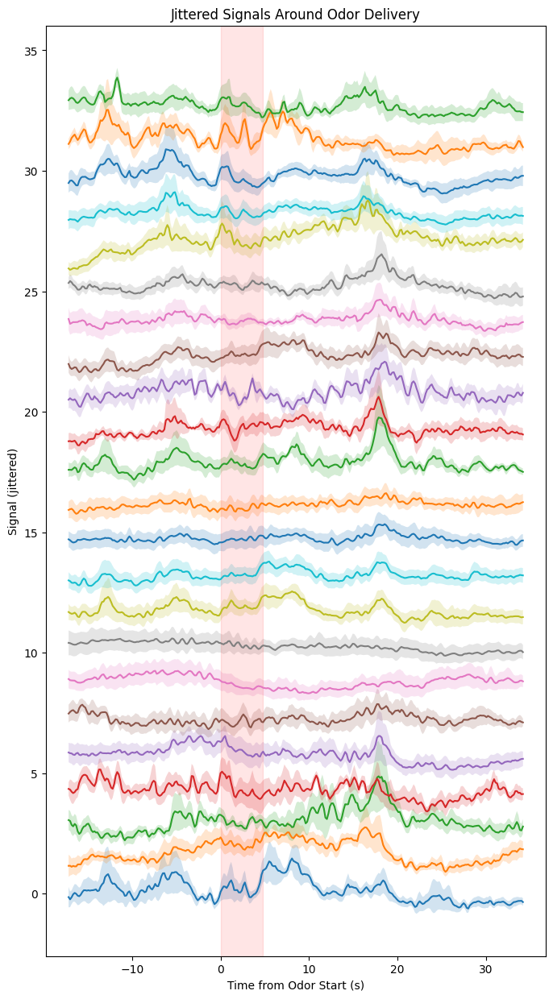

In [115]:
def plot_jittered_signals_around_odor(sn_binx, behav_df, y_jitter):
    """
    Plots all rows of sn_binx in a jittered manner on the y-axis around the odor delivery windows.

    Parameters:
    - sn_binx: 2D numpy array with dimensions (rows, time) representing signals to plot.
    - behav_df: DataFrame containing behavioral data, including time, odor_start, and odor_end.
    - y_jitter: float, the y-offset to apply between each row for clarity.
    """
    fig, ax = plt.subplots(figsize=[8,15])
    odor_start, odor_end = find_odor_start_end(behav_df)
    
    # Loop through each row in sn_binx
    for row_idx in range(sn_binx.shape[0]):
        odor_all = []
        for i in range(len(odor_start)-1):
            ind1 = odor_start[i] - 100
            ind2 = odor_start[i] + 200
            odor_all.append(sn_binx[row_idx, ind1:ind2])
        
        # Calculate mean and standard deviation for odor_all segments
        odor_mean = np.mean(np.array(odor_all), axis=0)
        odor_std = np.std(np.array(odor_all), axis=0) / np.sqrt(len(odor_all))  # Standard Error of the Mean (SEM)
        
        # Plot the mean signal for each row with y-offset
        ax.plot(behav_df.time[ind1:ind2] - behav_df.time[odor_start[i]], odor_mean + (row_idx * y_jitter), label=f'Row {row_idx}')
        
        # Optional: Add fill_between for SEM or STD
        ax.fill_between(behav_df.time[ind1:ind2] - behav_df.time[odor_start[i]],
                         odor_mean - odor_std + (row_idx * y_jitter),
                         odor_mean + odor_std + (row_idx * y_jitter), alpha=0.2)

    # Highlight the odor delivery window
    ax.axvspan(0, behav_df.time[odor_end[0]] - behav_df.time[odor_start[0]], color='red', alpha=0.1)
    
    plt.xlabel('Time from Odor Start (s)')
    plt.ylabel('Signal (jittered)')
    plt.title('Jittered Signals Around Odor Delivery')
    #plt.legend()
plot_jittered_signals_around_odor(sn_binx, behav_df, 1.5)

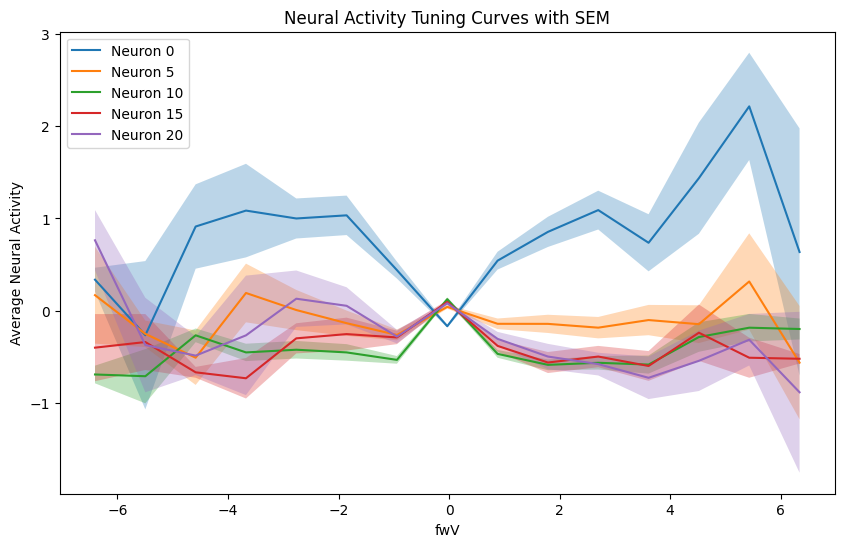

In [149]:

# Assuming neural_activity is your neurons*time_step matrix
# and behavior_variable is your behavioral variable array of length time_step

# Example data (replace these with your actual data)
neural_activity = sn_binx  # 100 neurons, 1000 time steps
behavior_variable = behav_df.fwV  # Example behavioral variable

# Select example neurons to plot
neurons_to_plot = [0, 5, 10, 15, 20]  # Example indices of neurons
num_bins = 15  # Number of bins for the behavioral variable
def tuning_curve_1d(behavior_variable, neural_activity,neurons_to_plot,num_bins):
# Bin the behavioral variable
    bins = np.linspace(np.min(behavior_variable), np.max(behavior_variable), num_bins+1)
    bin_centers = 0.5 * (bins[1:] + bins[:-1])

    # Initialize a plot
    plt.figure(figsize=(10, 6))

    # Plot tuning curves with SEM for selected neurons
    for neuron_index in neurons_to_plot:
        # Bin neural activity based on the behavioral variable
        binned_activity = np.empty(num_bins)
        binned_sem = np.empty(num_bins)  # Array to store the SEM values for each bin
        
        for i in range(num_bins):
            # Find indices of behavior_variable that fall into the current bin
            indices = np.where((behavior_variable >= bins[i]) & (behavior_variable < bins[i+1]))[0]
            # Calculate the mean activity of the current neuron for these indices
            bin_data = neural_activity[neuron_index, indices]
            binned_activity[i] = np.mean(bin_data)
            # Calculate SEM for the current bin
            binned_sem[i] = sem(bin_data)
        
        # Plot mean activity
        plt.plot(bin_centers, binned_activity, label=f'Neuron {neuron_index}')
        # Add SEM shading
        plt.fill_between(bin_centers, binned_activity - binned_sem, binned_activity + binned_sem, alpha=0.3)

    # Beautifying the plot
    plt.xlabel(behavior_variable.name)
    plt.ylabel('Average Neural Activity')
    plt.legend()
    plt.title('Neural Activity Tuning Curves with SEM')
    plt.show()
tuning_curve_1d(behavior_variable, neural_activity,neurons_to_plot,num_bins)

In [223]:

def filter_based_on_histogram(behavior_variable, min_freq_threshold):
    """
    Filters the behavioral variable data to remove points distant from the main mode,
    isolated by at least two consecutive bins with very low frequency. Automatically adjusts
    bins based on the Freedman-Diaconis rule.
    
    Parameters:
    - behavior_variable: Pandas Series, the behavioral variable data.
    - min_freq_threshold: The minimum frequency (as a proportion of total) to consider a bin as non-negligible.
    
    Returns:
    - Pandas Series, filtered behavioral variable data.
    """
    # Calculate bin width using the Freedman-Diaconis rule
    #IQR = np.subtract(*np.percentile(behavior_variable, [75, 25]))
    #n = len(behavior_variable)
    bin_width = 1
    range_ = np.max(behavior_variable) - np.min(behavior_variable)
    bins = int(np.round(range_ / bin_width))
    print(bins)
    # Compute the histogram with the calculated number of bins
    counts, bin_edges = np.histogram(behavior_variable, bins=bins)
    #total_points = n
    #freqs = counts / total_points  # Frequency of each bin
    
    # Identify bins below the frequency threshold
    low_freq_bins_mask = counts < min_freq_threshold
    
    # Find indices where two consecutive bins are below the threshold
    two_consecutive_low_bins = np.where(np.convolve(low_freq_bins_mask, [1,1], mode='valid') == 2)[0]
    
    if two_consecutive_low_bins.size == 0:
        return behavior_variable  # No such consecutive low bins, return original series
    
    # Determine cutoffs
    mode_bin_index = np.argmax(counts)
    lower_cutoff_bins = two_consecutive_low_bins[two_consecutive_low_bins < mode_bin_index]
    upper_cutoff_bins = two_consecutive_low_bins[two_consecutive_low_bins > mode_bin_index]
    lower_cutoff = bin_edges[0] if lower_cutoff_bins.size == 0 else bin_edges[lower_cutoff_bins.max() + 2]  # +2 to include the low bin
    upper_cutoff = bin_edges[-1] if upper_cutoff_bins.size == 0 else bin_edges[upper_cutoff_bins.min()]
    
    # Filter the behavioral variable
    filtered_variable = behavior_variable[(behavior_variable >= lower_cutoff) & (behavior_variable <= upper_cutoff)]
    
    return filtered_variable
# Example usage:

14
148
46
6


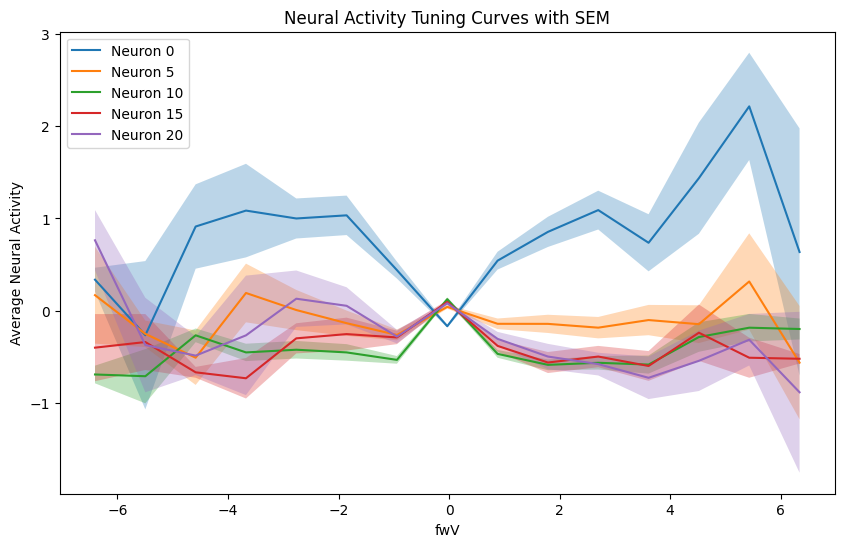

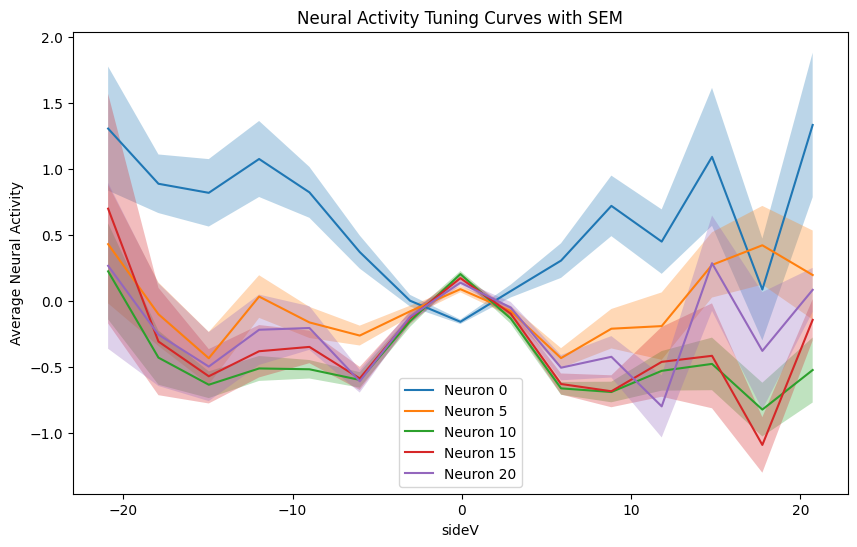

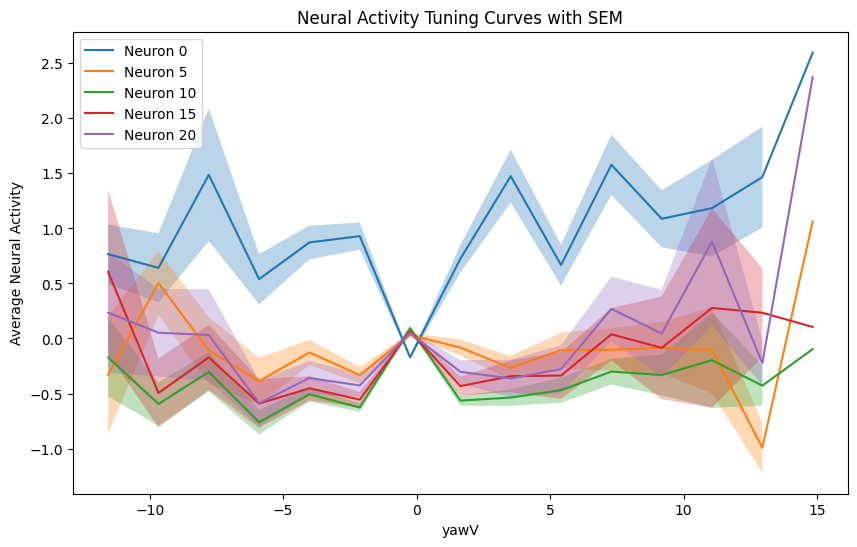

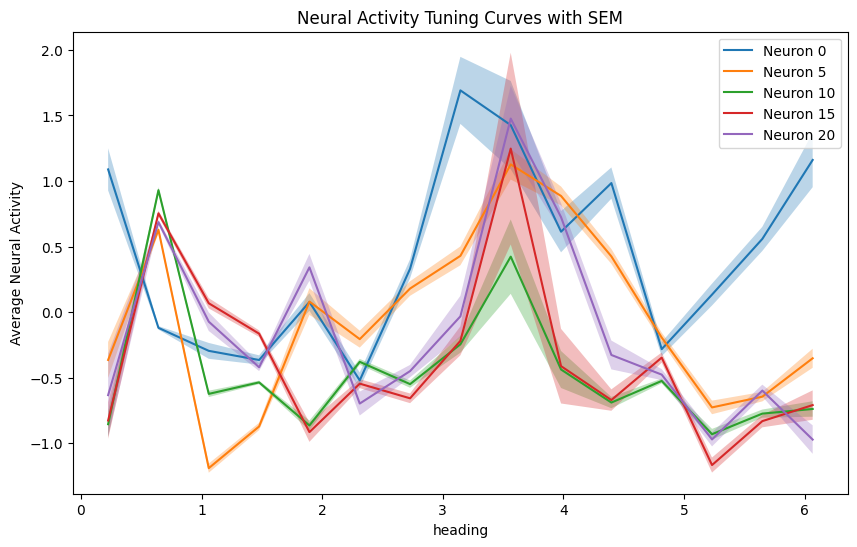

In [224]:
# Determine the number of rows and columns for the subplot grid
behavioral_variables = [behav_df.fwV, behav_df.sideV, behav_df.yawV, behav_df.heading]
filtered_behavior_variables = [filter_based_on_histogram(var, 0.5) for var in behavioral_variables]

num_behavioral_variables = len(filtered_behavior_variables)

# Loop through behavioral variables and plot
for i, behavior_variable in enumerate(filtered_behavior_variables):
    tuning_curve_1d(behavior_variable, neural_activity, neurons_to_plot, num_bins)



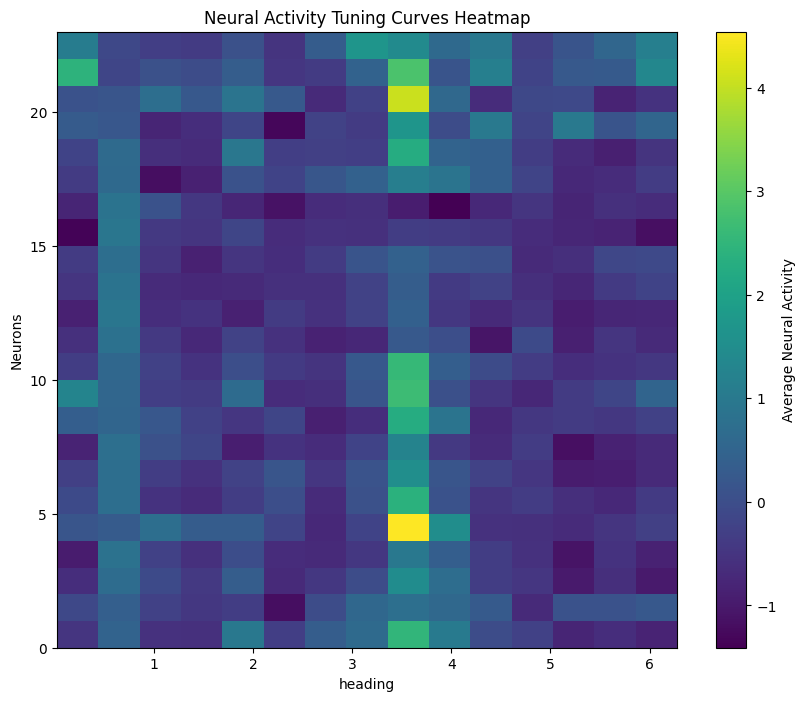

In [226]:


# Bin the behavioral variable
#num_bins = 15  # Number of bins for the behavioral variable
def tuning_curve_pop(num_bins, behavior_variable, neural_activity):
    bins = np.linspace(np.min(behavior_variable), np.max(behavior_variable), num_bins+1)
    bin_centers = 0.5 * (bins[1:] + bins[:-1])

    # Initialize an array to hold the mean activity for each neuron across bins
    mean_activity_matrix = np.zeros((neural_activity.shape[0], num_bins))

    # Calculate the mean activity for each neuron in each bin
    for i in range(neural_activity.shape[0]):  # Loop over neurons
        for j in range(num_bins):  # Loop over bins
            # Find indices of behavior_variable that fall into the current bin
            indices = np.where((behavior_variable >= bins[j]) & (behavior_variable < bins[j+1]))[0]
            # Calculate the mean activity of the current neuron for these indices
            if len(indices) > 0:
                mean_activity_matrix[i, j] = np.mean(neural_activity[i, indices])
            else:
                mean_activity_matrix[i, j] = np.nan  # Use NaN for bins with no data points

    # Plotting the heatmap
    plt.figure(figsize=(10, 8))
    plt.imshow(mean_activity_matrix, aspect='auto', cmap='viridis',
            extent=[bins[0], bins[-1], 0, neural_activity.shape[0]])
    plt.colorbar(label='Average Neural Activity')
    plt.xlabel(behavior_variable.name)
    plt.ylabel('Neurons')
    plt.title('Neural Activity Tuning Curves Heatmap')
    plt.show()
tuning_curve_pop(num_bins, behavior_variable, neural_activity)

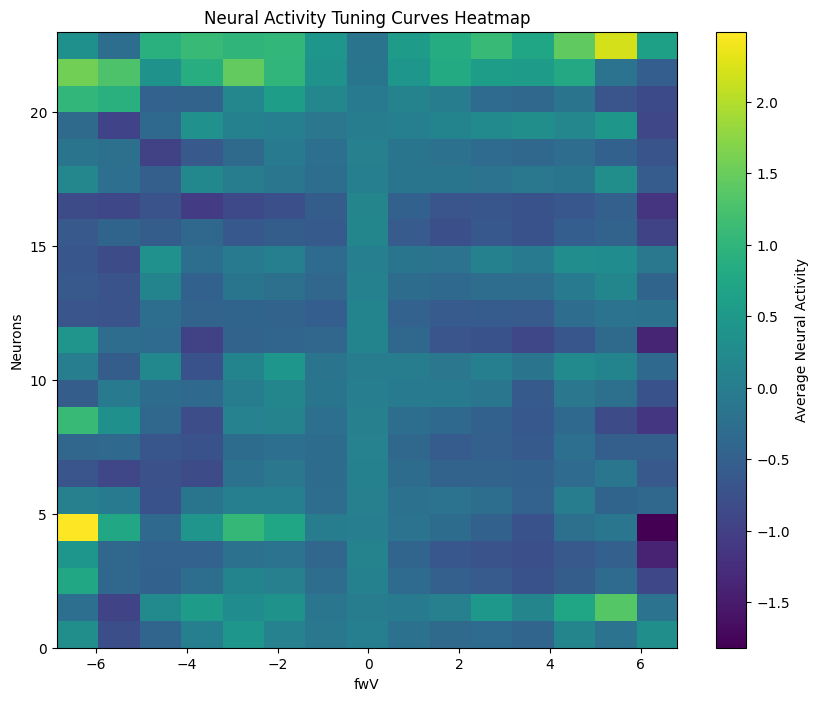

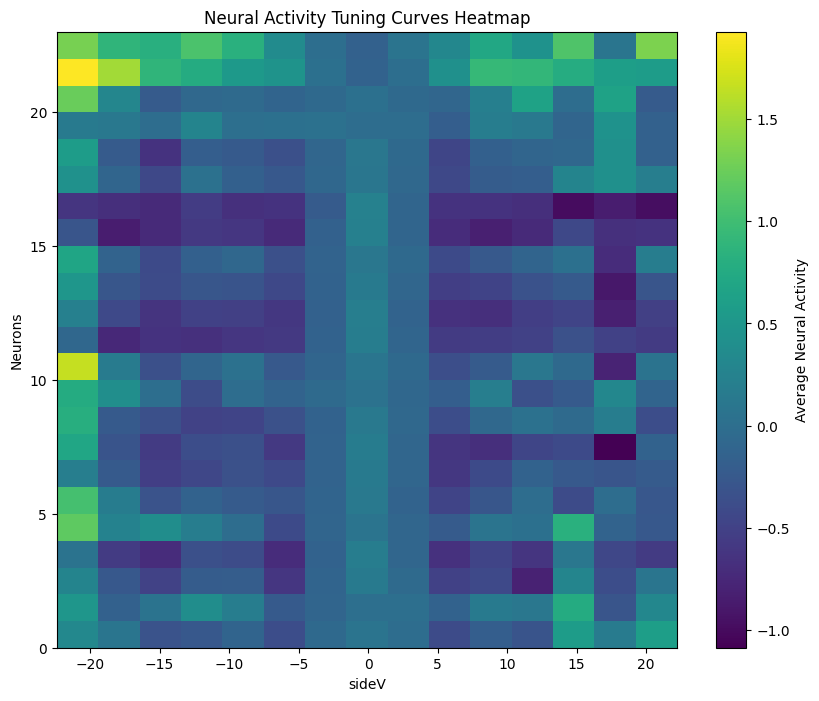

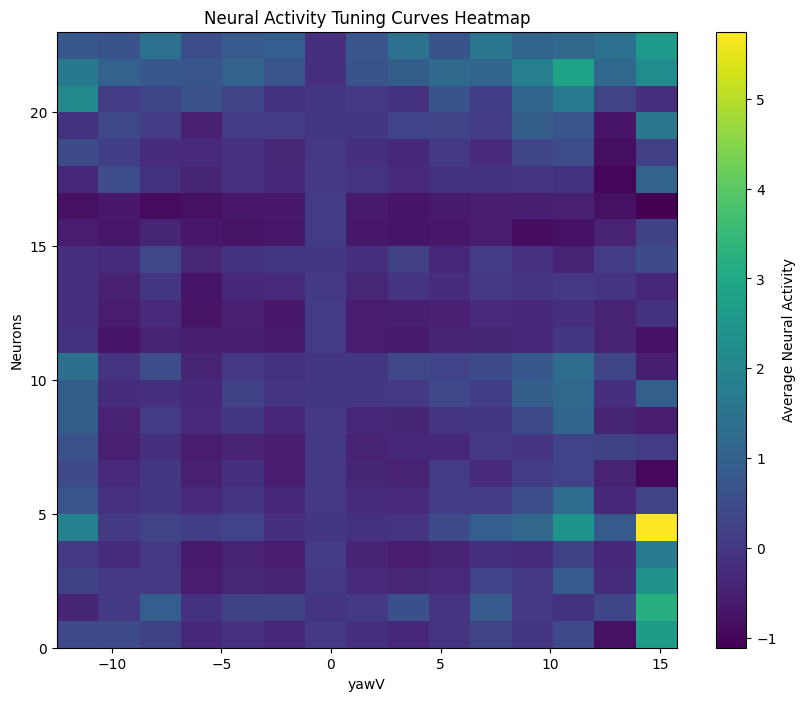

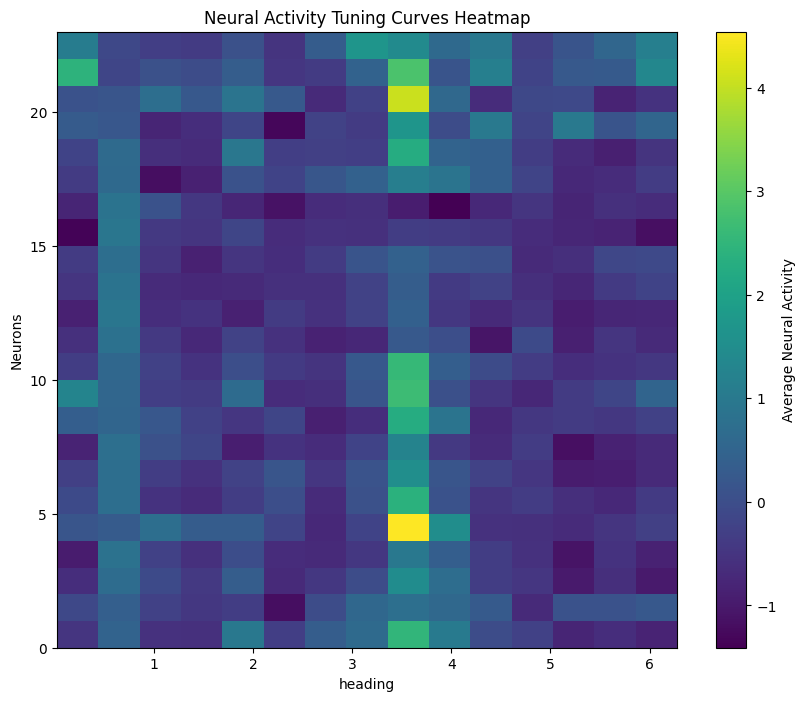

In [227]:
for i, behavior_variable in enumerate(filtered_behavior_variables):
    tuning_curve_pop(num_bins, behavior_variable, neural_activity)

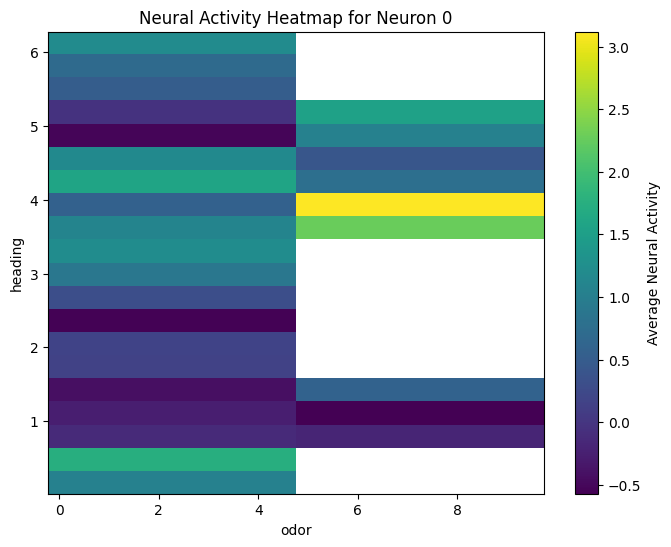

In [130]:
# Example data setup
neural_activity = sn_binx  # 100 neurons, 1000 time steps
behavior_variable_1 = behav_df.heading  # Example behavioral variable 1
behavior_variable_2 = behav_df.odor  # Example behavioral variable 2

# Specify the neuron of interest
neuron_index = 0  # Example neuron index

# Number of bins for each behavioral variable
num_bins_1 = 20
num_bins_2 = 2
def tuning_curve_2d(behavior_variable_1, behavior_variable_2, neural_activity,neuron_index,num_bins_1,num_bins_2):
# Create bins for both behavioral variables
    bins_1 = np.linspace(np.min(behavior_variable_1), np.max(behavior_variable_1), num_bins_1 + 1)
    bins_2 = np.linspace(np.min(behavior_variable_2), np.max(behavior_variable_2), num_bins_2 + 1)

    # Initialize an array to hold the mean activity for each bin combination
    mean_activity_matrix = np.zeros((num_bins_1, num_bins_2))

    # Calculate the mean activity for each bin combination
    for i in range(num_bins_1):
        for j in range(num_bins_2):
            # Find indices that fall into the current bin combination
            indices = np.where((behavior_variable_1 >= bins_1[i]) & (behavior_variable_1 < bins_1[i+1]) &
                            (behavior_variable_2 >= bins_2[j]) & (behavior_variable_2 < bins_2[j+1]))[0]
            # Calculate mean activity for these indices
            if len(indices) > 0:
                mean_activity_matrix[i, j] = np.mean(neural_activity[neuron_index, indices])
            else:
                mean_activity_matrix[i, j] = np.nan  # Use NaN for bins with no data points

    # Plotting the heatmap
    plt.figure(figsize=(8, 6))
    plt.imshow(mean_activity_matrix, origin='lower', aspect='auto', cmap='viridis',
            extent=[bins_2[0], bins_2[-1], bins_1[0], bins_1[-1]])
    plt.colorbar(label='Average Neural Activity')
    plt.xlabel('odor')
    plt.ylabel('heading')
    plt.title(f'Neural Activity Heatmap for Neuron {neuron_index}')
    plt.show()
tuning_curve_2d(behavior_variable_1, behavior_variable_2, neural_activity,neuron_index,num_bins_1,num_bins_2)

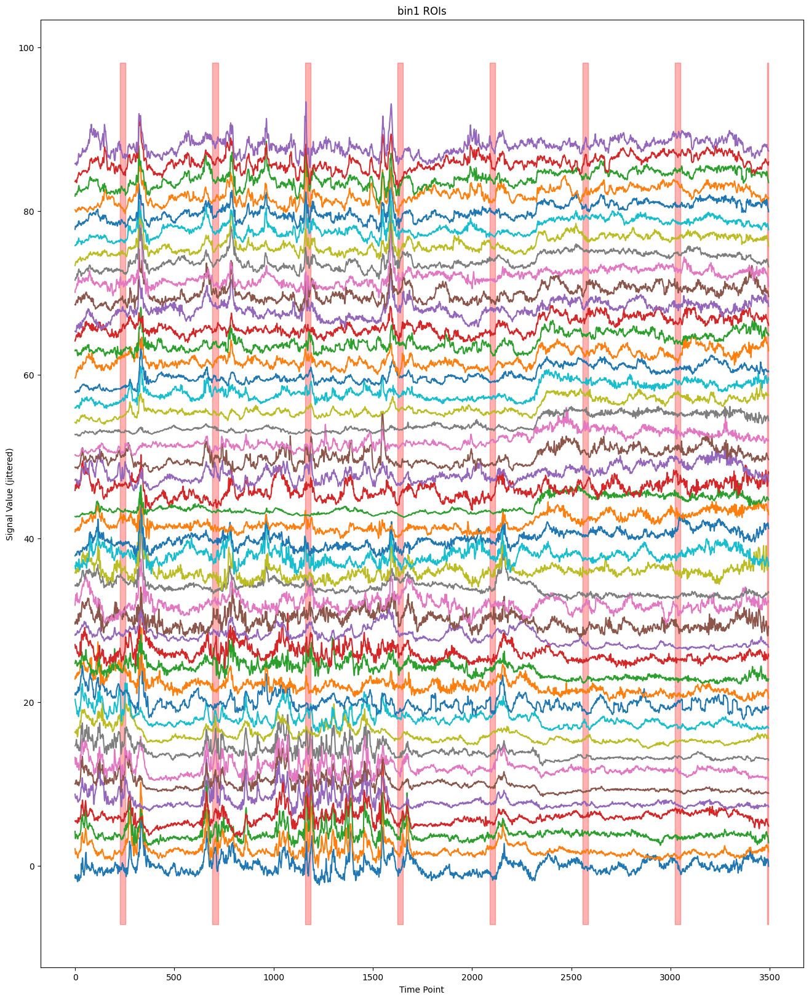

In [108]:
fig,ax = plt.subplots(figsize=(16, 20))
bin_index = 1
# Plot each signal with a jitter on the y-axis
y_offset = 2  # Adjust the offset value as needed
sn_binx = sn[mapped_embeddings == bin_index]
for i in range(len(sn_binx)):
    ax.plot(sn_binx[i,:] + (i * y_offset), label=f'Signal {i+1}')
ax.fill_between(behav_df.index, ax.get_ylim()[0], ax.get_ylim()[1], where=odor_mask, color='red', alpha=0.3)
    
# Add labels and title
plt.xlabel('Time Point')
plt.ylabel('Signal Value (jittered)')
plt.title('bin1 ROIs')

# Optionally, add a legend
#plt.legend()

# Show the plot
plt.show()

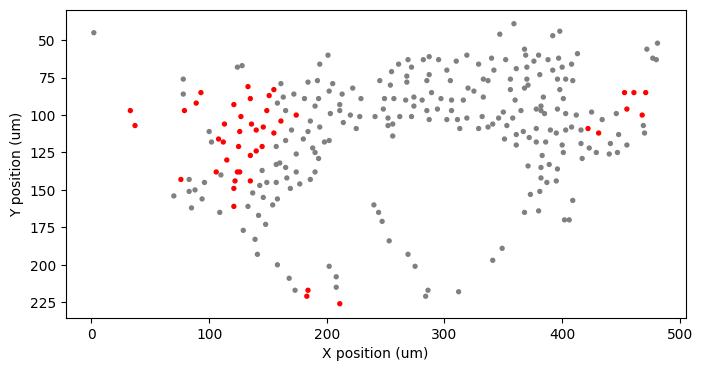

In [109]:
highlight_class(bin_index, mapped_embeddings)

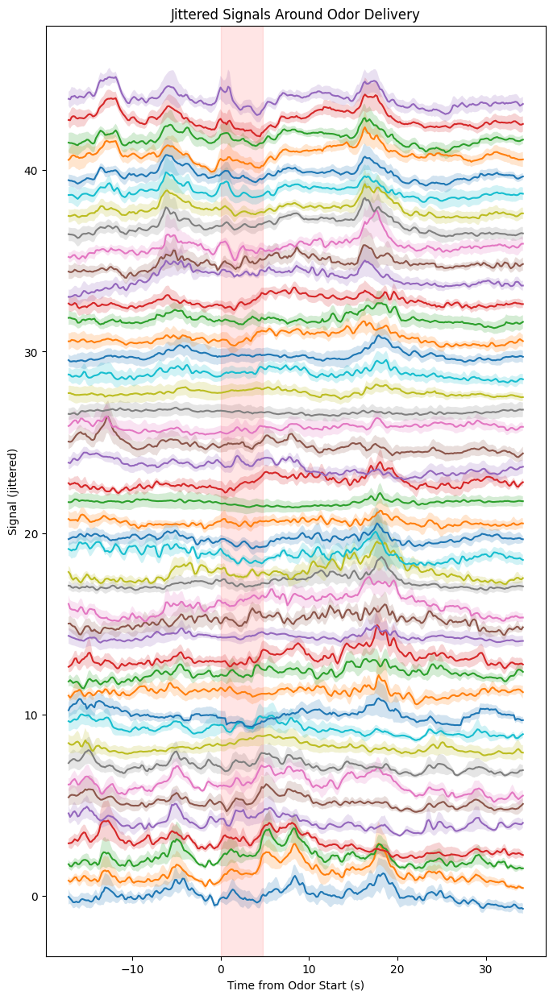

In [110]:
plot_jittered_signals_around_odor(sn_binx, behav_df, 1)

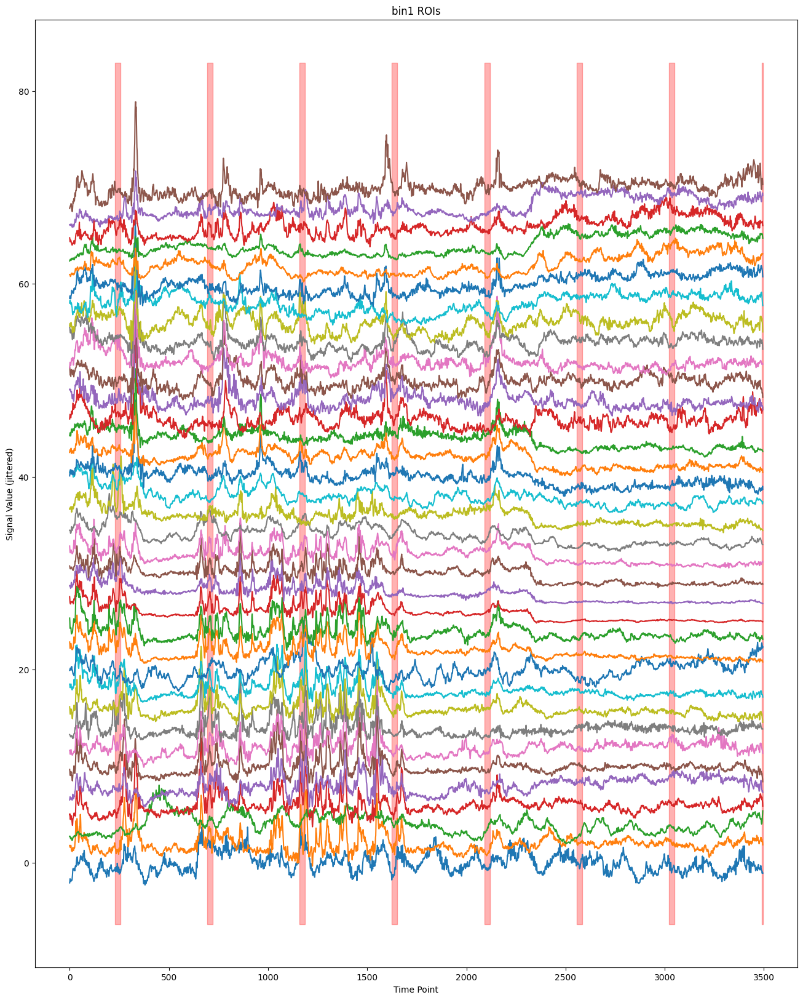

In [87]:
fig,ax = plt.subplots(figsize=(16, 20))
bin_index = 2
# Plot each signal with a jitter on the y-axis
y_offset = 2  # Adjust the offset value as needed
sn_binx = sn[mapped_embeddings == bin_index]
for i in range(len(sn_binx)):
    ax.plot(sn_binx[i,:] + (i * y_offset), label=f'Signal {i+1}')
ax.fill_between(behav_df.index, ax.get_ylim()[0], ax.get_ylim()[1], where=odor_mask, color='red', alpha=0.3)
    
# Add labels and title
plt.xlabel('Time Point')
plt.ylabel('Signal Value (jittered)')
plt.title('bin1 ROIs')

# Optionally, add a legend
#plt.legend()

# Show the plot
plt.show()

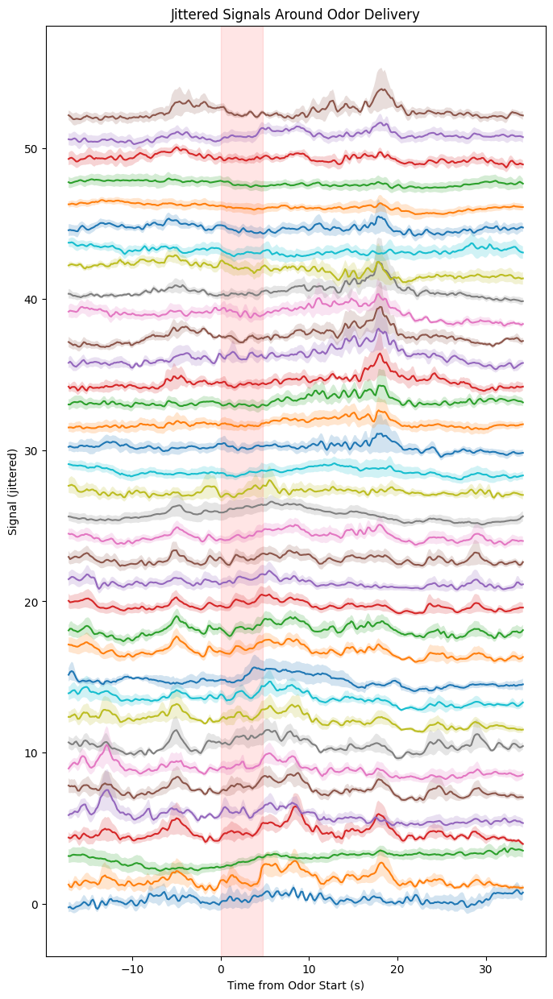

In [88]:
plot_jittered_signals_around_odor(sn_binx, behav_df, 1.5)